In [1]:
import numpy as np
import pandas as pd
import os
import json

import imageio
import cv2
# import geopandas as gpd
# import higra as hg

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import font_manager as fm
import matplotlib.patches as mpatches
import seaborn as sns
%matplotlib inline

import sys
sys.path.append('../../resuneta/src')
from bound_dist import get_distance, get_boundary

from sklearn.metrics import matthews_corrcoef

# Helpful functions

In [74]:
def get_masked_mcc(logits, extent_mask, boundary_kernel_size=(2,2), threshold=0.5):
    boundary_mask = get_boundary(extent_mask, kernel_size=boundary_kernel_size)

    # define label mask
    label_mask = np.array((extent_mask + boundary_mask) < 1, dtype=np.float32)
    
    # mask out unlabeled pixels
    logits_with_mask = np.ma.MaskedArray(logits, mask=label_mask)
    extent_with_mask = np.ma.MaskedArray(extent_mask, mask=label_mask)
    logits_masked = logits_with_mask[logits_with_mask.mask == False].data
    extent_masked = extent_with_mask[extent_with_mask.mask == False].data
    
    # compute MCC
    img_mcc = matthews_corrcoef(extent_masked > 0, logits_masked > threshold)
    
    return img_mcc

# Which month is the best?

## Visualize example images

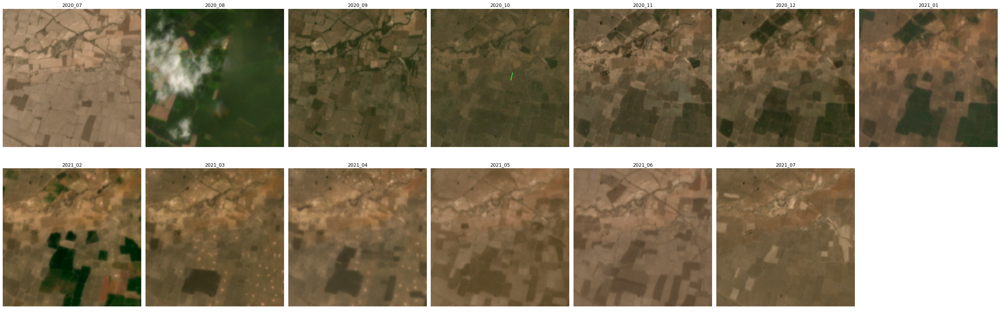

In [6]:
img_dir = '../data/planet/india/GeneralBlockchain/monthly_mosaics_renamed_clipped_merged/'
month_dirs = ['2020_{}'.format(str(x).zfill(2)) for x in range(7, 13)] + \
             ['2021_{}'.format(str(x).zfill(2)) for x in range(1, 8)]
image_names = sorted([x.split('_')[0] for x in os.listdir(os.path.join(img_dir, '2021_01'))])

for image_name in image_names[:1]:
    fig, ax = plt.subplots(2, 7, figsize=(36, 12))
    for m, month in enumerate(month_dirs):
        random_image = imageio.imread(os.path.join(img_dir, month, image_name + '_' + month + '.tif'))[:256,:256,:3]
        i = m // 7
        j = m % 7
        ax[i,j].imshow(random_image)
        ax[i,j].set_title('{}'.format(month))
        ax[i,j].axis('off')
    ax[-1,-1].axis('off')
    plt.tight_layout()
    plt.show()

## Model trained on all months separately

In [7]:
img_dir = '../data/planet/india/GeneralBlockchain/monthly_mosaics_renamed_clipped_merged_samples/'
label_dir = '../data/planet/india/GeneralBlockchain/extent_labels/'
results_dir = '../results/india/GeneralBlockchain/resunet-d6_all_nfilter-16_bs-8_lr-0.001_4x-downsampled-partial_finetuned/'
for month in month_dirs:
    extent_pred_dir = os.path.join(results_dir, 'planet', month, 'extent_predictions/')
    boundary_pred_dir = os.path.join(results_dir, 'planet', month, 'boundary_predictions/')

In [108]:
results_df = pd.read_csv(os.path.join(results_dir, 'results.csv'))
results_df['sample_id'] = results_df['image_id'].str[:4]
results_df.head()

,image_path,mcc,fold,image_id,month,sample_id
0,../data/planet/india/GeneralBlockchain/monthly...,0.084213,train,0005a,2020_07,0005
1,../data/planet/india/GeneralBlockchain/monthly...,0.119843,train,0005b,2020_07,0005
2,../data/planet/india/GeneralBlockchain/monthly...,0.120791,train,0005c,2020_07,0005
3,../data/planet/india/GeneralBlockchain/monthly...,NaN,train,0009a,2020_07,0009
4,../data/planet/india/GeneralBlockchain/monthly...,0.243178,train,0009b,2020_07,0009


In [9]:
results_max = results_df.dropna(subset=['mcc']).groupby('image_id').max().reset_index()

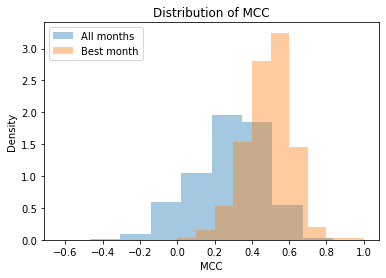

In [11]:
plt.hist(results_df['mcc'], alpha=0.4, density=True)
plt.hist(results_max['mcc'], alpha=0.4, density=True)
plt.xlabel('MCC')
plt.ylabel('Density')
plt.title('Distribution of MCC')
plt.legend(['All months', 'Best month'])
plt.show()

In [12]:
print("Training set:")
print("  All months mean MCC = {:0.2f}".format(results_df[results_df['fold'] == 'train']['mcc'].mean()))
print("  Best month mean MCC = {:0.2f}".format(results_max[results_max['fold'] == 'train']['mcc'].mean()))
print("Validation set:")
print("  All months mean MCC = {:0.2f}".format(results_df[results_df['fold'] == 'val']['mcc'].mean()))
print("  Best month mean MCC = {:0.2f}".format(results_max[results_max['fold'] == 'val']['mcc'].mean()))

Training set:
  All months mean MCC = 0.27
  Best month mean MCC = 0.49
Validation set:
  All months mean MCC = 0.31
  Best month mean MCC = 0.50


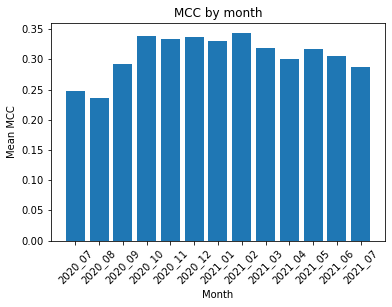

In [13]:
grouped_by_month = results_df[results_df['fold'] == 'val'].dropna(subset=['mcc']).groupby('month').mean().reset_index()
grouped_by_month_std = results_df[results_df['fold'] == 'val'].dropna(subset=['mcc']).groupby('month').std().reset_index()
x = grouped_by_month['month'].values
y = grouped_by_month['mcc'].values
variance = grouped_by_month_std['mcc'].values

x_pos = [i for i, _ in enumerate(x)]

plt.bar(x_pos, y, color='C0') #, yerr=variance)
plt.xlabel("Month")
plt.ylabel("Mean MCC")
plt.title("MCC by month")

plt.xticks(x_pos, x, rotation=45)

plt.show()

### Within-location vs. between location variance

In [114]:
# compare variance from Planet imagery vs. location (field size and other factors)
# SST = SSW + SSB
results_clean = results_df.dropna(subset=['mcc']).reset_index(drop=True)
mean_df = results_clean.groupby(['sample_id']).mean().reset_index().rename({'mcc': 'mcc_mean_monthly'}, axis=1)
mean = results_clean['mcc'].mean()
results_clean['mcc_mean'] = mean
results_clean = results_clean.merge(mean_df, on='sample_id', how='left')

ssw = ((results_clean['mcc'] - results_clean['mcc_mean_monthly'])**2).sum()
ssb = ((results_clean['mcc_mean_monthly'] - results_clean['mcc_mean'])**2).sum()
print("Sum of squares within = {:0.2f}".format(ssw))
print("Sum of squares between = {:0.2f}".format(ssb))
print("% Sum of squares within = {:0.2f}".format(ssw / (ssw+ssb)))
print("% Sum of squares between = {:0.2f}".format(ssb / (ssw+ssb)))

Sum of squares within = 1031.95
Sum of squares between = 778.99
% Sum of squares within = 0.57
% Sum of squares between = 0.43


In [115]:
# leave out samples
results_clean = results_df.dropna(subset=['mcc']).reset_index(drop=True).drop_duplicates(['sample_id', 'month'])
mean_df = results_clean.groupby(['sample_id']).mean().reset_index().rename({'mcc': 'mcc_mean_monthly'}, axis=1)
mean = results_clean['mcc'].mean()
results_clean['mcc_mean'] = mean
results_clean = results_clean.merge(mean_df, on='sample_id', how='left')

ssw = ((results_clean['mcc'] - results_clean['mcc_mean_monthly'])**2).sum()
ssb = ((results_clean['mcc_mean_monthly'] - results_clean['mcc_mean'])**2).sum()
print("Sum of squares within = {:0.2f}".format(ssw))
print("Sum of squares between = {:0.2f}".format(ssb))
print("% Sum of squares within = {:0.2f}".format(ssw / (ssw+ssb)))
print("% Sum of squares between = {:0.2f}".format(ssb / (ssw+ssb)))

Sum of squares within = 340.25
Sum of squares between = 296.30
% Sum of squares within = 0.53
% Sum of squares between = 0.47


In [116]:
# validation set only
results_clean = results_df[results_df['fold'] == 'val'].dropna(subset=['mcc']).reset_index(drop=True).drop_duplicates(['sample_id', 'month'])
mean_df = results_clean.groupby(['sample_id']).mean().reset_index().rename({'mcc': 'mcc_mean_monthly'}, axis=1)
mean = results_clean['mcc'].mean()
results_clean['mcc_mean'] = mean
results_clean = results_clean.merge(mean_df, on='sample_id', how='left')

ssw = ((results_clean['mcc'] - results_clean['mcc_mean_monthly'])**2).sum()
ssb = ((results_clean['mcc_mean_monthly'] - results_clean['mcc_mean'])**2).sum()
print("Sum of squares within = {:0.2f}".format(ssw))
print("Sum of squares between = {:0.2f}".format(ssb))
print("% Sum of squares within = {:0.2f}".format(ssw / (ssw+ssb)))
print("% Sum of squares between = {:0.2f}".format(ssb / (ssw+ssb)))

Sum of squares within = 57.63
Sum of squares between = 51.50
% Sum of squares within = 0.53
% Sum of squares between = 0.47


### Geographical distribution of MCC by month

In [153]:
bbox_df = pd.read_csv('../data/planet/india/GeneralBlockchain/bbox_india_GB_download.csv', dtype=str)
bbox_df = bbox_df.rename({'image_id': 'sample_id'}, axis=1)
median_mcc = results_df.groupby('sample_id').median().reset_index()
median_mcc = bbox_df.merge(median_mcc, on='sample_id', how='inner')

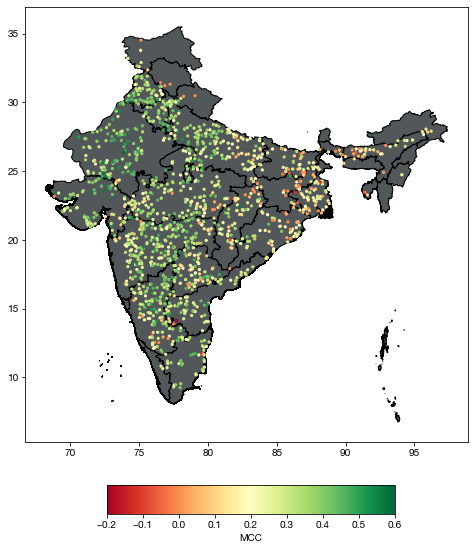

In [47]:
# median MCC across all months and across samples (3 per location)
india = gpd.read_file('../mount/data/gadm36_IND_shp/gadm36_IND_1.shp')
fig, ax = plt.subplots(1, figsize=(8,8))
india.plot(ax=ax, edgecolor='black', color='#525759')

im = plt.scatter(median_mcc['min_lon'].astype(float), median_mcc['min_lat'].astype(float), 
                 c=median_mcc['mcc'], vmin=-0.2, vmax=0.6, s=5, cmap='RdYlGn')
cax = fig.add_axes([0.27, 0, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')
cax.set_xlabel('MCC')
plt.show()

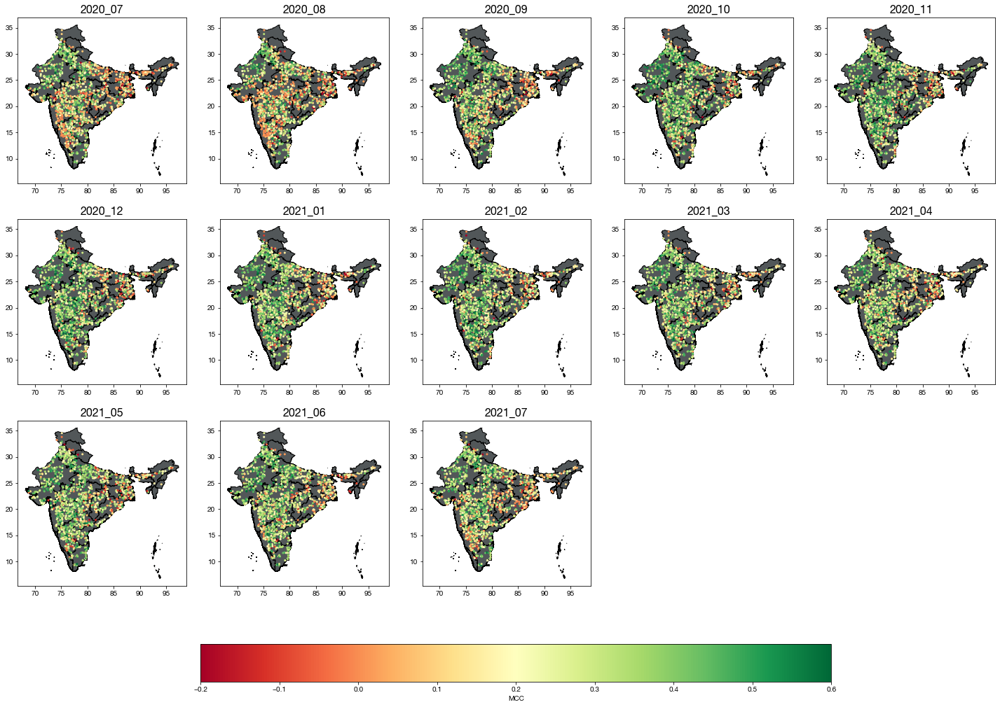

In [55]:
# MCC by month, median across 3 samples per location
india = gpd.read_file('../mount/data/gadm36_IND_shp/gadm36_IND_1.shp')
nrows, ncols = 3, 5
fs = 16
fig, ax = plt.subplots(nrows, ncols, figsize=(25, 15))

for m, month in enumerate(month_dirs):
    median_month = results_df[results_df['month'] == month].groupby('sample_id').median().reset_index()
    median_month = bbox_df.merge(median_month, on='sample_id', how='inner')

    i, j = m // ncols, m % ncols
    india.plot(ax=ax[i,j], edgecolor='black', color='#525759')
    im = ax[i,j].scatter(median_month['min_lon'].astype(float), median_month['min_lat'].astype(float), 
                         c=median_month['mcc'], vmin=-0.2, vmax=0.6, s=4, cmap='RdYlGn')
    ax[i,j].set_title(month, fontsize=fs)
    
ax[-1,-1].axis('off')
ax[-1,-2].axis('off')
cax = fig.add_axes([0.27, 0, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')
cax.set_xlabel('MCC')
plt.show()

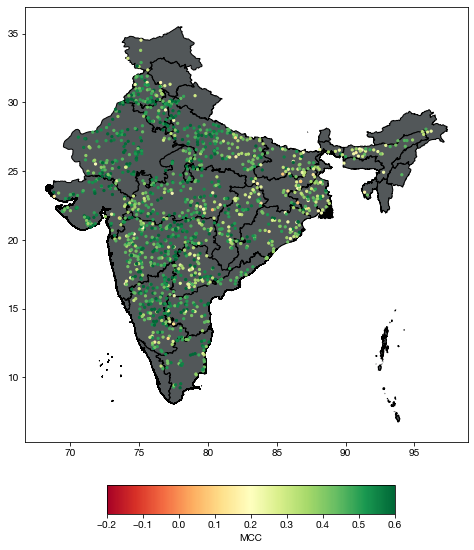

In [57]:
# max MCC across all months and across samples (3 per location)
max_mcc = results_df.groupby(['sample_id', 'month']).median().reset_index().groupby('sample_id').max().reset_index()
max_mcc = bbox_df.merge(max_mcc, on='sample_id', how='inner')

# india = gpd.read_file('../mount/data/gadm36_IND_shp/gadm36_IND_1.shp')
fig, ax = plt.subplots(1, figsize=(8,8))
india.plot(ax=ax, edgecolor='black', color='#525759')

im = plt.scatter(max_mcc['min_lon'].astype(float), max_mcc['min_lat'].astype(float), 
                 c=max_mcc['mcc'], vmin=-0.2, vmax=0.6, s=5, cmap='RdYlGn')
cax = fig.add_axes([0.27, 0, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')
cax.set_xlabel('MCC')
plt.show()

### Naive consensus

In [75]:
results_images = results_df.dropna(subset=['mcc']).drop_duplicates(subset=['image_id'])

img_dir = '../data/planet/india/GeneralBlockchain/monthly_mosaics_renamed_clipped_merged_samples/'
month_dirs = ['2020_{}'.format(str(x).zfill(2)) for x in range(7, 13)] + \
             ['2021_{}'.format(str(x).zfill(2)) for x in range(1, 8)]
image_names = results_images['image_id'].values
consensus_mccs = []

for i, image_name in enumerate(image_names):
    if i % 100 == 0:
        print(i)
    
    all_preds = np.zeros((256, 256, len(month_dirs)))
    for m, month in enumerate(month_dirs):
        predicted = np.load(os.path.join(results_dir, 'planet', month, 'extent_predictions', image_name + '.npy'))
        all_preds[:,:,m] = predicted
        
    label = imageio.imread('../data/planet/india/GeneralBlockchain/extent_labels/{}.png'.format(image_name))[:256,:256]
    consensus = all_preds.mean(axis=-1)
    mcc_consensus = get_masked_mcc(consensus, label, boundary_kernel_size=(2,2), threshold=0.5)
    consensus_mccs.append(mcc_consensus)

0
100


/home/swang222/anaconda3/envs/mxnet1.6.0/lib/python3.6/site-packages/sklearn/metrics/_classification.py:846: RuntimeWarning: invalid value encountered in double_scalars
  mcc = cov_ytyp / np.sqrt(cov_ytyt * cov_ypyp)


200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900


In [81]:
results_images['consensus_mcc'] = consensus_mccs

print("Training set:")
print("  All months mean MCC = {:0.2f}".format(results_df[results_df['fold'] == 'train']['mcc'].mean()))
print("  Best month mean MCC = {:0.2f}".format(results_max[results_max['fold'] == 'train']['mcc'].mean()))
print("  Consensus mean MCC = {:0.2f}".format(results_images[results_images['fold'] == 'train']['consensus_mcc'].mean()))
print("Validation set:")
print("  All months mean MCC = {:0.2f}".format(results_df[results_df['fold'] == 'val']['mcc'].mean()))
print("  Best month mean MCC = {:0.2f}".format(results_max[results_max['fold'] == 'val']['mcc'].mean()))
print("  Consensus mean MCC = {:0.2f}".format(results_images[results_images['fold'] == 'val']['consensus_mcc'].mean()))

Training set:
  All months mean MCC = 0.27
  Best month mean MCC = 0.49
  Consensus mean MCC = 0.39
Validation set:
  All months mean MCC = 0.31
  Best month mean MCC = 0.50
  Consensus mean MCC = 0.43


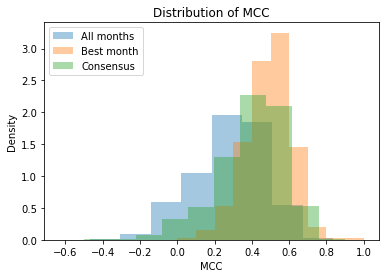

In [79]:
plt.hist(results_df['mcc'], alpha=0.4, density=True)
plt.hist(results_max['mcc'], alpha=0.4, density=True)
plt.hist(results_images['consensus_mcc'], alpha=0.4, density=True)
plt.xlabel('MCC')
plt.ylabel('Density')
plt.title('Distribution of MCC')
plt.legend(['All months', 'Best month', 'Consensus'])
plt.show()

### Consensus best threshold (on training set)

In [124]:
results_images = results_df.dropna(subset=['mcc']).drop_duplicates(subset=['image_id'])
thresholds = np.linspace(0, 1, 101)

img_dir = '../data/planet/india/GeneralBlockchain/monthly_mosaics_renamed_clipped_merged_samples/'
month_dirs = ['2020_{}'.format(str(x).zfill(2)) for x in range(7, 13)] + \
             ['2021_{}'.format(str(x).zfill(2)) for x in range(1, 8)]
image_names = results_images[results_images['fold'] == 'train']['image_id'].values
consensus_mccs_thresholds = np.zeros((len(image_names), len(thresholds)))

for i, image_name in enumerate(image_names):
    if i % 100 == 0:
        print(i)
    
    all_preds = np.zeros((256, 256, len(month_dirs)))
    for m, month in enumerate(month_dirs):
        predicted = np.load(os.path.join(results_dir, 'planet', month, 'extent_predictions', image_name + '.npy'))
        all_preds[:,:,m] = predicted
        
    label = imageio.imread('../data/planet/india/GeneralBlockchain/extent_labels/{}.png'.format(image_name))[:256,:256]
    consensus = all_preds.mean(axis=-1)
    
    for t, threshold in enumerate(thresholds):
        mcc_consensus = get_masked_mcc(consensus, label, boundary_kernel_size=(2,2), threshold=threshold)
        consensus_mccs_thresholds[i,t] = mcc_consensus

0


/home/swang222/anaconda3/envs/mxnet1.6.0/lib/python3.6/site-packages/sklearn/metrics/_classification.py:846: RuntimeWarning: invalid value encountered in double_scalars
  mcc = cov_ytyp / np.sqrt(cov_ytyt * cov_ypyp)


100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200


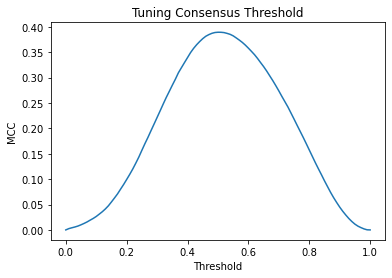

In [131]:
plt.plot(thresholds, consensus_mccs_thresholds.mean(axis=0))
plt.title('Tuning Consensus Threshold')
plt.xlabel('Threshold')
plt.ylabel('MCC')
plt.show()

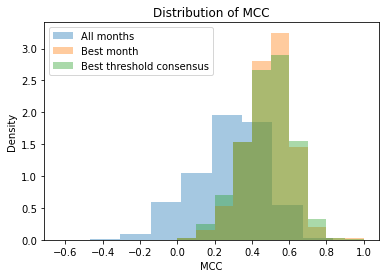

In [138]:
plt.hist(results_df['mcc'], alpha=0.4, density=True)
plt.hist(results_max['mcc'], alpha=0.4, density=True)
plt.hist(consensus_mccs_thresholds.max(axis=1), alpha=0.4, density=True)
plt.xlabel('MCC')
plt.ylabel('Density')
plt.title('Distribution of MCC')
plt.legend(['All months', 'Best month', 'Best threshold consensus'])
plt.show()

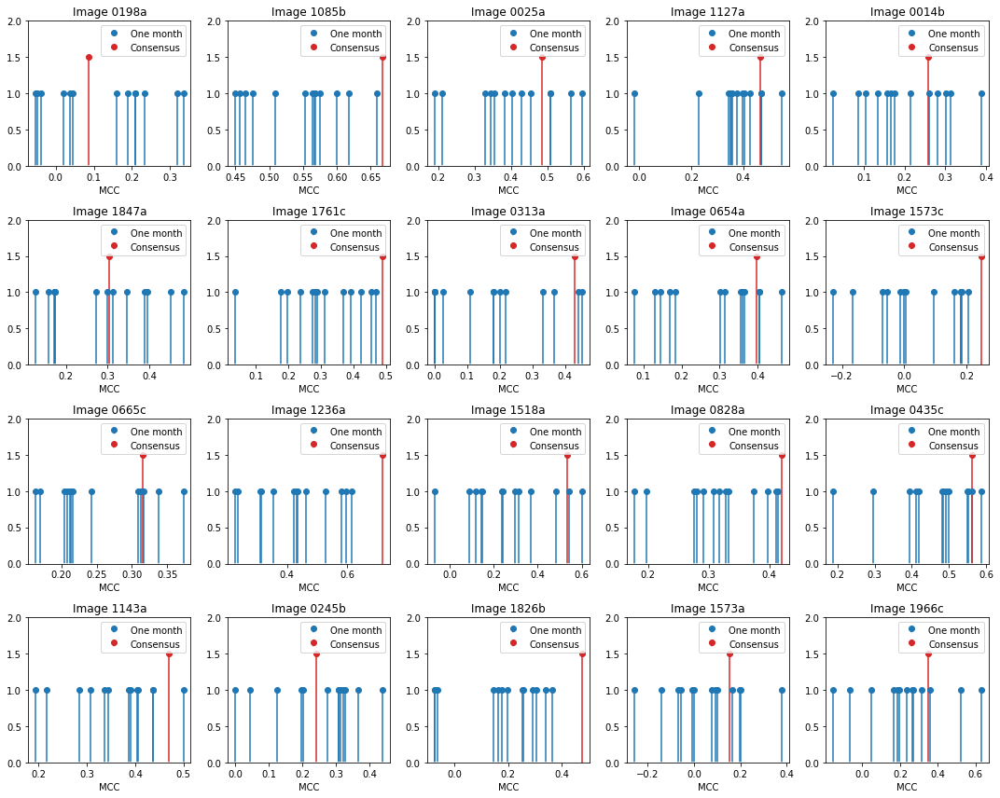

In [152]:
# distribution of MCC by month vs. consensus
n_samples = 20
random_idx = np.random.choice(np.arange(len(image_names)), n_samples)
results_clean = results_df.dropna(subset=['mcc']).reset_index(drop=True)

nrows, ncols = 4, 5
fig, ax = plt.subplots(nrows, ncols, figsize=(15, 12))
for d, idx in enumerate(random_idx):
    i, j = d // ncols, d % ncols
    
    image_name = image_names[idx]
    mccs = results_clean[results_clean['image_id'] == image_name]['mcc'].values
    ax[i,j].stem(mccs, np.ones(len(mccs)), linefmt='C0-', markerfmt='C0o', basefmt='white')
    ax[i,j].stem([consensus_mccs_thresholds[idx, 50]], [1.5], linefmt='C3-', markerfmt='C3o', basefmt='white')
    ax[i,j].set_ylim([0, 2])
    ax[i,j].set_title('Image ' + image_name)
    ax[i,j].set_xlabel('MCC')
    ax[i,j].legend(['One month', 'Consensus'])
plt.tight_layout()
plt.show()

### Locations with best median MCC

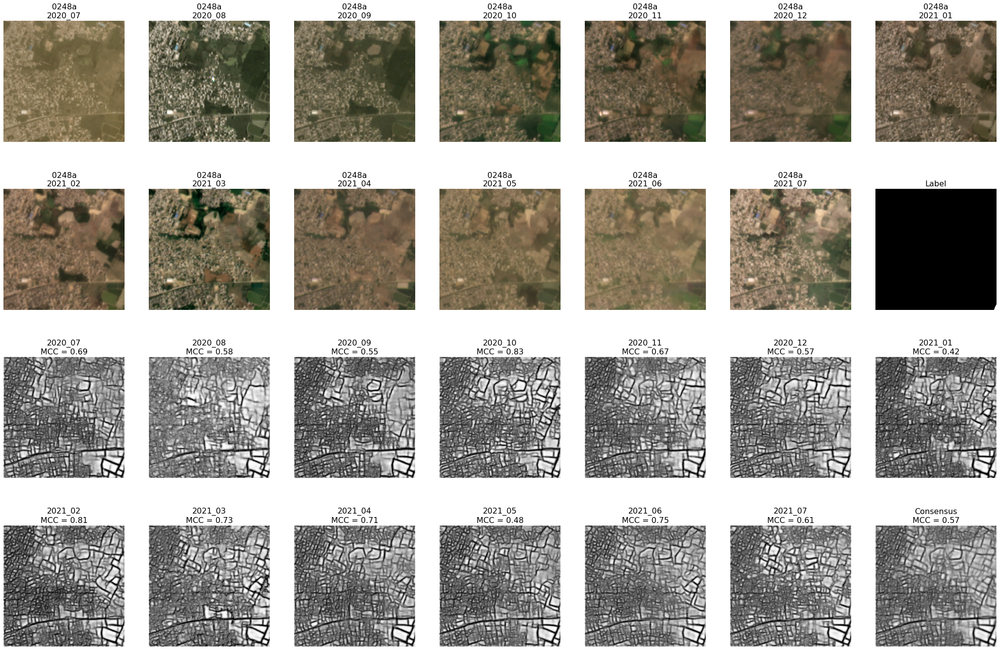

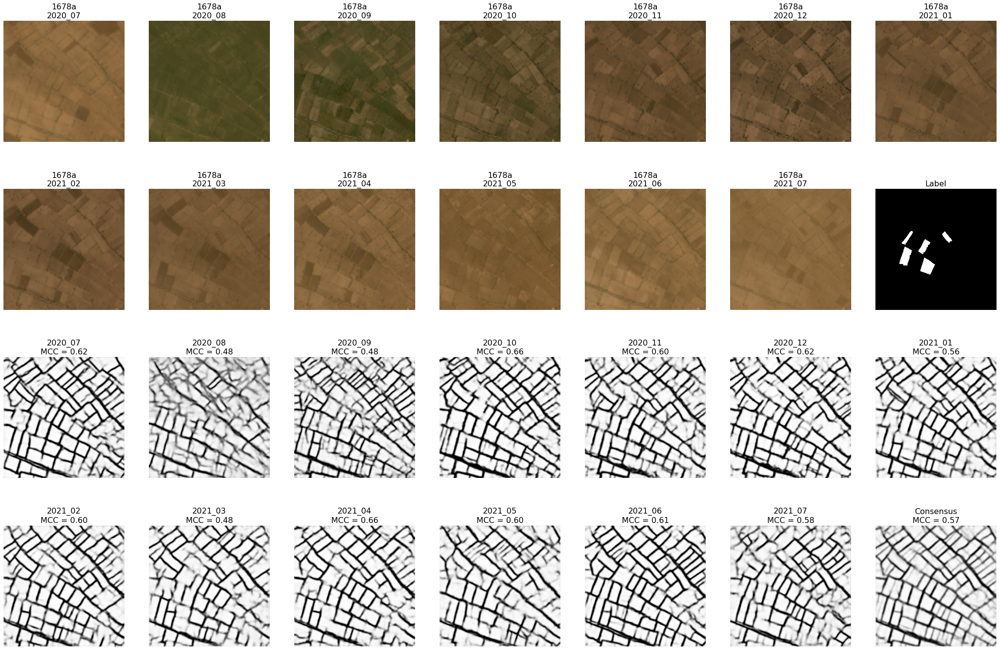

In [65]:
fs = 16
for i, row in median_mcc.sort_values('mcc', ascending=False).iloc[:2].iterrows():
    fig, ax = plt.subplots(4, 7, figsize=(36, 24))
    
    image_name = row['sample_id'] + 'a'
    all_preds = np.zeros((256, 256, len(month_dirs)))
    for m, month in enumerate(month_dirs):
        planet_image = imageio.imread(os.path.join(img_dir, month, image_name + '_' + month + '.tif'))[:256,:256,:3]
        predicted = np.load(os.path.join(results_dir, 'planet', month, 'extent_predictions', image_name + '.npy'))
        all_preds[:,:,m] = predicted
        mcc = results_df[(results_df['image_id'] == image_name) & (results_df['month'] == month)]['mcc'].values[0]
        
        i = m // 7
        j = m % 7
        
        ax[i,j].imshow(planet_image)
        ax[i,j].set_title(image_name + '\n{}'.format(month), fontsize=fs)
        ax[i,j].axis('off')
        
        ax[i+2,j].imshow(predicted, cmap='Greys_r')
        ax[i+2,j].set_title('{}'.format(month) + '\nMCC = {:0.2f}'.format(mcc), fontsize=fs)
        ax[i+2,j].axis('off')
    label = imageio.imread('../data/planet/india/GeneralBlockchain/extent_labels/{}.png'.format(image_name))[:256,:256]
    consensus = all_preds.mean(axis=-1)

    mcc_consensus = get_masked_mcc(consensus, label, boundary_kernel_size=(2,2))
    ax[-1,-1].imshow(consensus, cmap='Greys_r')
    ax[-1,-1].set_title('Consensus' + '\nMCC = {:0.2f}'.format(mcc_consensus), fontsize=fs)
    ax[-1,-1].axis('off')
    
    ax[1,-1].imshow(label, cmap='Greys_r')
    ax[1,-1].set_title('Label', fontsize=fs)
    ax[1,-1].axis('off')

    plt.show()

### Locations with the worst median MCC

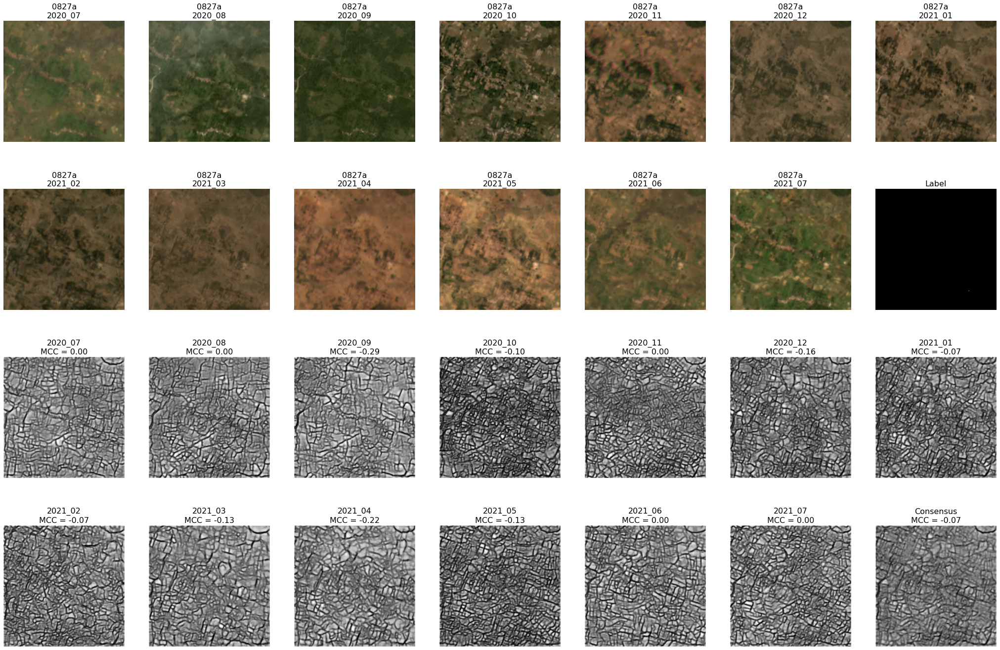

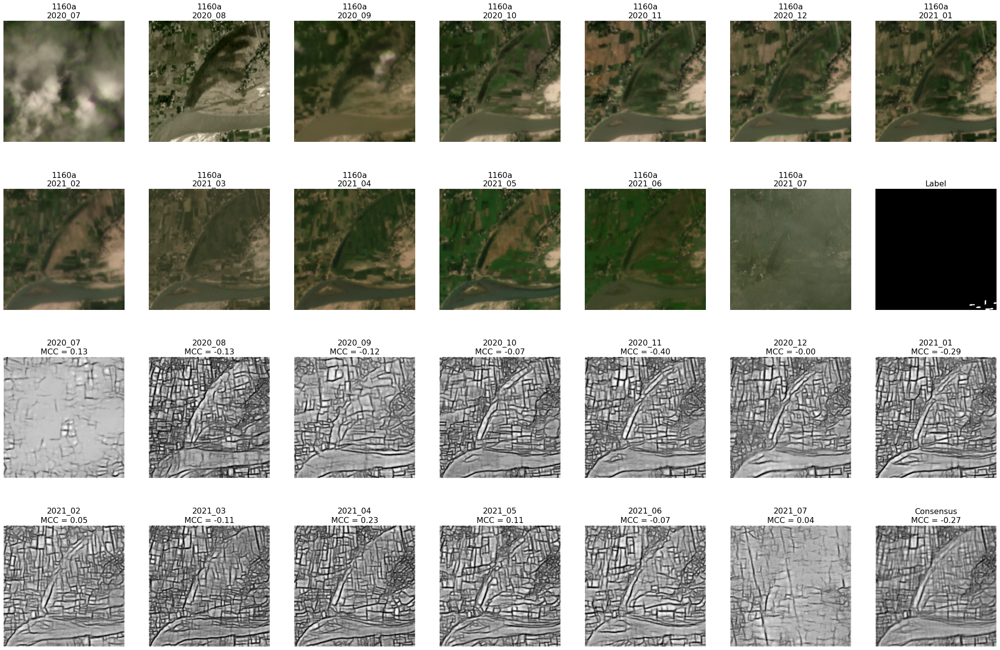

In [156]:
fs = 16
for i, row in median_mcc.sort_values('mcc', ascending=True).iloc[5:7].iterrows():
    fig, ax = plt.subplots(4, 7, figsize=(36, 24))
    
    image_name = row['sample_id'] + 'a'
    all_preds = np.zeros((256, 256, len(month_dirs)))
    for m, month in enumerate(month_dirs):
        planet_image = imageio.imread(os.path.join(img_dir, month, image_name + '_' + month + '.tif'))[:256,:256,:3]
        predicted = np.load(os.path.join(results_dir, 'planet', month, 'extent_predictions', image_name + '.npy'))
        all_preds[:,:,m] = predicted
        mcc = results_df[(results_df['image_id'] == image_name) & (results_df['month'] == month)]['mcc'].values[0]
        
        i = m // 7
        j = m % 7
        
        ax[i,j].imshow(planet_image)
        ax[i,j].set_title(image_name + '\n{}'.format(month), fontsize=fs)
        ax[i,j].axis('off')
        
        ax[i+2,j].imshow(predicted, cmap='Greys_r')
        ax[i+2,j].set_title('{}'.format(month) + '\nMCC = {:0.2f}'.format(mcc), fontsize=fs)
        ax[i+2,j].axis('off')
    label = imageio.imread('../data/planet/india/GeneralBlockchain/extent_labels/{}.png'.format(image_name))[:256,:256]
    consensus = all_preds.mean(axis=-1)

    mcc_consensus = get_masked_mcc(consensus, label, boundary_kernel_size=(2,2))
    ax[-1,-1].imshow(consensus, cmap='Greys_r')
    ax[-1,-1].set_title('Consensus' + '\nMCC = {:0.2f}'.format(mcc_consensus), fontsize=fs)
    ax[-1,-1].axis('off')
    
    ax[1,-1].imshow(label, cmap='Greys_r')
    ax[1,-1].set_title('Label', fontsize=fs)
    ax[1,-1].axis('off')

    plt.show()

### Why are there NaN MCCs?

In [ ]:
# no labeled field pixels in image

### Example predictions

0005a


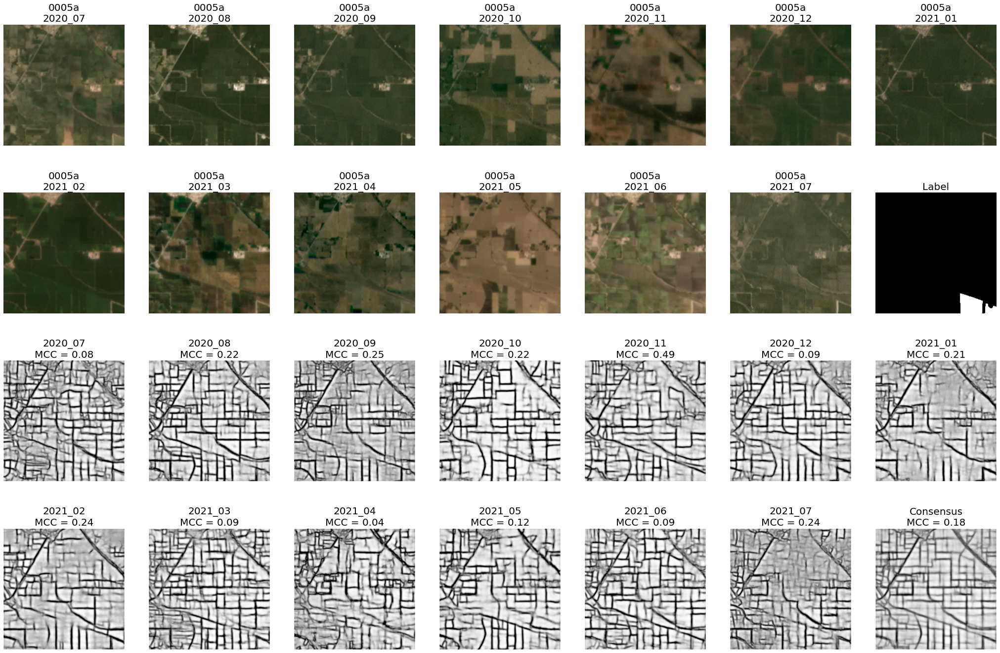

In [67]:
img_dir = '../data/planet/india/GeneralBlockchain/monthly_mosaics_renamed_clipped_merged_samples/'
month_dirs = ['2020_{}'.format(str(x).zfill(2)) for x in range(7, 13)] + \
             ['2021_{}'.format(str(x).zfill(2)) for x in range(1, 8)]
image_names = results_df.dropna(subset=['mcc'])['image_id'].values # sorted([x.split('_')[0] for x in os.listdir(os.path.join(img_dir, '2021_01'))])
fs = 20

for image_name in image_names[::3][:1]:
    print(image_name)
    fig, ax = plt.subplots(4, 7, figsize=(36, 24))
    
    all_preds = np.zeros((256, 256, len(month_dirs)))
    for m, month in enumerate(month_dirs):
        planet_image = imageio.imread(os.path.join(img_dir, month, image_name + '_' + month + '.tif'))[:256,:256,:3]
        predicted = np.load(os.path.join(results_dir, 'planet', month, 'extent_predictions', image_name + '.npy'))
        all_preds[:,:,m] = predicted
        mcc = results_df[(results_df['image_id'] == image_name) & (results_df['month'] == month)]['mcc'].values[0]
        
        i = m // 7
        j = m % 7
        
        ax[i,j].imshow(planet_image)
        ax[i,j].set_title(image_name + '\n{}'.format(month), fontsize=fs)
        ax[i,j].axis('off')
        
        ax[i+2,j].imshow(predicted, cmap='Greys_r')
        ax[i+2,j].set_title('{}'.format(month) + '\nMCC = {:0.2f}'.format(mcc), fontsize=fs)
        ax[i+2,j].axis('off')
    label = imageio.imread('../data/planet/india/GeneralBlockchain/extent_labels/{}.png'.format(image_name))[:256,:256]
    consensus = all_preds.mean(axis=-1)
    mcc_consensus = get_masked_mcc(consensus, label, boundary_kernel_size=(2,2))
    ax[-1,-1].imshow(consensus, cmap='Greys_r')
    ax[-1,-1].set_title('Consensus' + '\nMCC = {:0.2f}'.format(mcc_consensus), fontsize=fs)
    ax[-1,-1].axis('off')
    
    ax[1,-1].imshow(label, cmap='Greys_r')
    ax[1,-1].set_title('Label', fontsize=fs)
    ax[1,-1].axis('off')
#     plt.tight_layout()
    plt.show()

### Geographic distribution of MCC for consensus

In [161]:
# consensus MCC across all months
consensus_df = pd.read_csv('../results/india/GeneralBlockchain/' + \
                           'resunet-d6_all_nfilter-16_bs-8_lr-0.001_4x-downsampled-partial_finetuned/' + \
                           'results_consensus.csv')
consensus_df['sample_id'] = consensus_df['sample_id'].astype(str).str.zfill(4)
consensus_with_latlon = consensus_df.groupby('sample_id').median().reset_index().merge(
    bbox_df, on='sample_id', how='inner')
# india = gpd.read_file('../mount/data/gadm36_IND_shp/gadm36_IND_1.shp')
# fig, ax = plt.subplots(1, figsize=(8,8))
# india.plot(ax=ax, edgecolor='black', color='#525759')

# im = plt.scatter(consensus_df['min_lon'].astype(float), consensus_df['min_lat'].astype(float), 
#                  c=consensus_df['consensus_mcc'], vmin=-0.2, vmax=0.6, s=5, cmap='RdYlGn')
# cax = fig.add_axes([0.27, 0, 0.5, 0.05])
# fig.colorbar(im, cax=cax, orientation='horizontal')
# cax.set_xlabel('MCC')
# plt.show()

### Relationship with field size

In [2]:
planet_img = imageio.imread('../data/planet/india/GeneralBlockchain/monthly_mosaics_renamed_clipped_merged/2019_01/0001_2019_01.tif')

In [6]:
airbus_img = imageio.imread('../data/general_blockchain/airbus_false_color/large/original/airbus_geowiki_C0001.png')

In [4]:
planet_img.shape

(486, 493, 4)

In [7]:
airbus_img.shape

(1505, 1513, 3)